<h3>What is Yield?</h3>
In simple terms, yield is the return an investor receives on a bond or other fixed-income security. 
For U.S. Treasury bonds, the yield is the interest rate the government pays to borrow money for a specific period (e.g., 2 years, 10 years). 
It's a key indicator of economic sentiment because bond prices and yields move in opposite directions. 
When investors are optimistic about the economy, they might sell bonds, which drives prices down and yields up. 
The opposite happens when investors are seeking a safer investment.

What is the Aim of the Project?
The primary aim of this project is to visualize the relationship between the U.S. Treasury yield curve and recessions. 
The yield curve is a line that plots the yields of Treasury bonds against their maturity dates.

Normally, the curve slopes upward, meaning longer-term bonds have higher yields because they carry more risk. 
However, the curve sometimes "inverts" and slopes downward, meaning short-term yields are higher than long-term yields. 
This inversion has historically been a very reliable predictor of future economic recessions. 
This project uses historical data to animate the yield curve's spread and show how its inversion (going below zero) often precedes the shaded gray recession periods.

In [6]:
# ==> step 1: Import necessary libraries
# ==> pls install these if you dont have them
#!pip install pandas-datareader
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import pandas_datareader.data as web
import datetime as dt
import numpy as np
import base64 

from IPython.display import HTML, display

In [2]:
#  step 2, lets define data acquisition parameters
# We will pull data from the FRED database using pandas-datareader.
"""
The FRED database is a large online collection of economic data maintained by the Federal Reserve Bank of St. Louis. 
It stands for the Federal Reserve Economic Data.
It's a very popular resource for economists, researchers, students, and journalists because it provides free access to over 800,000 economic time series from various sources.
The data is a treasure trove of information, including everything from GDP and inflation rates to employment statistics and, in your case, Treasury yields.
The project uses it because it's a reliable, publicly available source for the historical data needed for the yield curve analysis.
"""
# 'DGS10' is the 10-Year Treasury Constant Maturity Rate
# 'DGS2' is the 2-Year Treasury Constant Maturity Rate
# 'USREC' is the US Recession Indicators (a boolean series)
start_date = dt.datetime(1980, 1, 1)

end_date = dt.datetime.now()

data_sources = ['DGS10', 'DGS2', 'USREC']

print("Fetching data from FRED...")

try:
    data = web.DataReader(data_sources, 'fred', start_date, end_date)
    print("Data fetched successfully.")

except Exception as e:
    print(f"Error fetching data: {e}")
    # --> create an empty DataFrame placeholder to prevent errors later
    data = pd.DataFrame(columns=data_sources)
    print("Please check your internet connection or try again later.")
    # ==> stop program from proceeding if this is not met
    exit()

Fetching data from FRED...
Data fetched successfully.


In [3]:
# --> step 3,  lets clean and prepare the data

data = data.dropna()

# --> lets calculate yield spread (10-Year minus 2-Year)
"""
The formula for yield spread is straightforward: 
it is the difference in yield between two different bonds. 
In this project, the yield spread would specifically the difference between the 10-year Treasury bond yield and the 2-year Treasury bond yield.

The formula is:

Yield Spread = Long-Term Yield - Short-Term Yield
"""


data['Spread'] = data['DGS10'] - data['DGS2']

print("\nData summary:")
print(data.head())
print(f"\nTotal data points: {len(data)}")


Data summary:
            DGS10   DGS2  USREC  Spread
DATE                                   
1980-02-01  11.29  12.04    1.0   -0.75
1980-04-01  12.69  14.59    1.0   -1.90
1980-05-01  10.57  10.70    1.0   -0.13
1980-07-01  10.13   9.01    1.0    1.12
1980-08-01  10.76   9.78    0.0    0.98

Total data points: 349


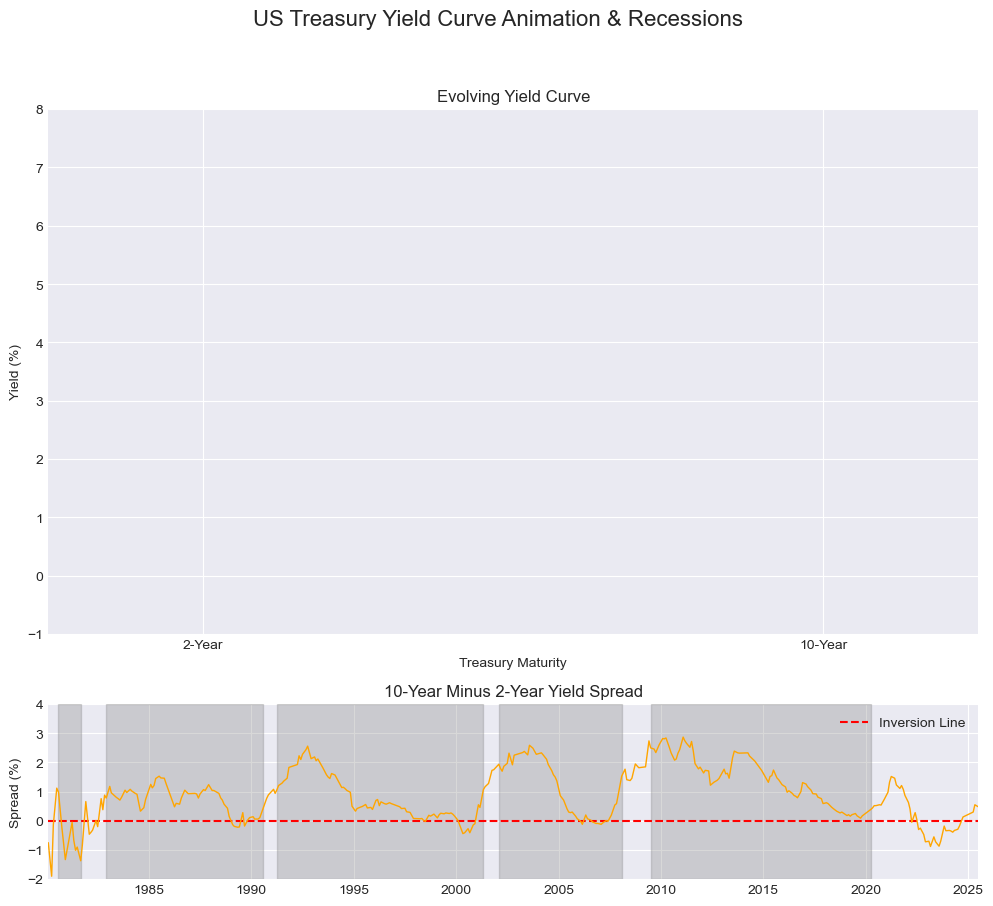

In [11]:
# =--> lets set up a plot to visualize this
# STEP 4: Set up the animated plot
# We'll create two subplots: one for the animated yield curve and one for the spread.
# The `FuncAnimation` function will update these plots over time.

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [3, 1]})
plt.style.use('seaborn-v0_8-darkgrid')
fig.suptitle('US Treasury Yield Curve Animation & Recessions', fontsize=16)

# Subplot 1: Animated Yield Curve
ax1.set_xlim(0, 12) # A bit beyond 10 to leave space for axis labels
ax1.set_ylim(-1, 8) # Adjust limits to fit typical yield ranges
ax1.set_xticks([2, 10])
ax1.set_xticklabels(['2-Year', '10-Year'])
ax1.set_xlabel('Treasury Maturity')
ax1.set_ylabel('Yield (%)')
ax1.set_title('Evolving Yield Curve')

line, = ax1.plot([], [], 'o-', lw=2, color='darkblue')

# Subplot 2: Yield Spread
ax2.set_xlim(data.index[0], data.index[-1])
ax2.set_ylim(-2, 4)
ax2.set_title('10-Year Minus 2-Year Yield Spread')
ax2.set_ylabel('Spread (%)')
ax2.axhline(0, color='red', linestyle='--', label='Inversion Line')
ax2.legend()

# Mark recession periods on the spread chart
recessions = data[data['USREC'] == 1]
recession_spans = []

# Find start and end dates of each recession using the difference method
if not recessions.empty:
    recessions_series = recessions['USREC']
    # Find points where the series transitions from 0 to 1 (recession start)
    start_dates = data['USREC'].diff()[data['USREC'].diff() == 1].index
    # Find points where the series transitions from 1 to 0 (recession end)
    end_dates = data['USREC'].diff()[data['USREC'].diff() == -1].index
    
    # Handle the case where a recession is ongoing (no end date yet)
    if start_dates.shape[0] > end_dates.shape[0]:
        end_dates = end_dates.append(pd.Index([data.index[-1]]))
    
    # Plot the shaded areas for each recession
    for start, end in zip(start_dates, end_dates):
        ax2.axvspan(start, end, color='gray', alpha=0.3, label='US Recession' if start == start_dates[0] else "")
        recession_spans.append((start, end))

# Plot the spread line
ax2.plot(data.index, data['Spread'], color='orange', lw=1)

# Initialize function for the animation
def init():
    line.set_data([], [])
    return line,

# Animation update function
def update(frame):
    # Get the data for the current frame
    current_date = data.index[frame]
    current_yields = data.iloc[frame][['DGS2', 'DGS10']]
    
    # Update the yield curve plot (ax1)
    x = [2, 10]
    y = current_yields.values
    line.set_data(x, y)
    
    # Update the title with the current date
    ax1.set_title(f'Evolving Yield Curve - {current_date.strftime("%B %d, %Y")}')
    
    return line,


Creating animation... This may take a moment.
Displaying animation...



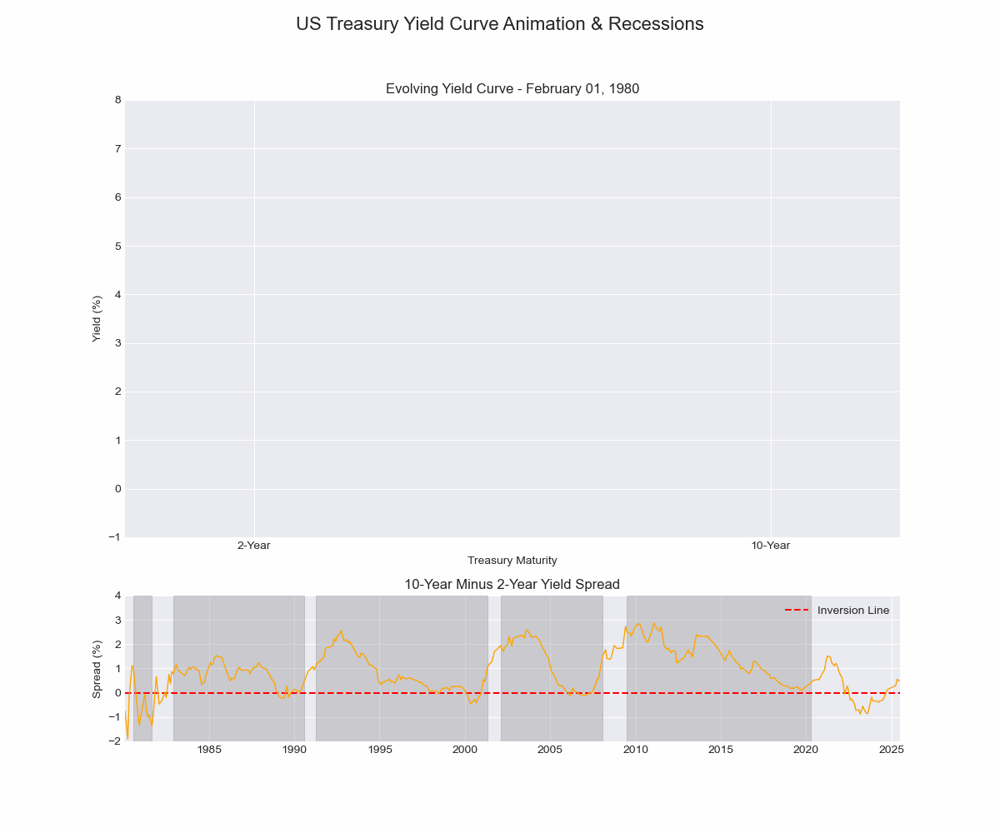

Animation finished. The plot should now be displayed.


In [12]:
# STEP 5: Create and show the animation
# `frames` determines the number of number of frames to render.
# `interval` is the delay between frames in milliseconds.
# `blit=True` helps with performance by only redrawing changed elements.

print("\nCreating animation... This may take a moment.")
ani = FuncAnimation(fig, update, frames=len(data),
                    init_func=init, blit=True, interval=1)

# Save the animation to a temporary file
temp_file = "yield_curve.gif"
writer = PillowWriter(fps=15)
ani.save(temp_file, writer=writer)

# Read the GIF file as binary data
with open(temp_file, "rb") as f:
    gif_data = f.read()

# Encode the binary data to a base64 string
encoded_gif = base64.b64encode(gif_data).decode('utf-8')

# Create an HTML <img> tag with the base64 string as the source
html_string = f'<img src="data:image/gif;base64,{encoded_gif}" />'

# Display the HTML in the notebook
print("Displaying animation...")
display(HTML(html_string))
print("Animation finished. The plot should now be displayed.")

<h3>What Does the Output Entail?</h3>
The selected code handles the final step of the project: creating and displaying the animation. Its output is a single, animated GIF file of the yield curve plot, displayed directly within your notebook's output cell.

Instead of showing a live, interactive plot, this code saves the animated chart as a file called yield_curve.gif. It then uses a function from the IPython.display library to embed and display that GIF file right there in your notebook. This is done to ensure the animation works reliably across different environments that may not support live, interactive Matplotlib plots.

In short, the output you see is the final, pre-rendered animation, which is exactly the intended result of this section of the code.